# Дипломная работа по NLP

«Создание аналитической информационной системы для выделения ключевых слов из учебных материалов»

## Выполнил: студент группы ПИ20-5, Валяев Георгий Анатольевич

В этом скрипте будут реализованы процессы:
- использования структуры датасета как результаты работы скрипта `DOCX_parser_Valyaev.ipynb`
- создания модели NLP, решающей задачу выделения ключевых слов в файле РПД
- подготовки финального датасета с ключевыми словами для последующей выгрузки в Google таблицу (базу данных классов дисциплин информационной системы)

**Все изменения и версии ноутбуков хранятся на репозитории GitHub:
https://github.com/Valyaevgeorgiy/VKR_work**

Полезные материалы и литература к работе:
- https://neurohive.io/ru/osnovy-data-science/7-arhitektur-nejronnyh-setej-nlp/
- https://neurohive.io/ru/papers/depth-estimation-using-encoder-decoder-networks-and-self-supervised-learning/
- https://nlp.stanford.edu/courses/cs224n/2011/reports/ehhuang.pdf

In [ ]:
import os, json, nltk, traceback
from google.colab import drive
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

## Подгрузка датасета

In [ ]:
PATH = '/content/gdrive/MyDrive/Диплом_Валяев/data'

docs_rpd_data = PATH+'/rpd_data.json'
docs_name_to_file_rpd = PATH+'/name_to_file_rpd.json'

drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


### Датасет корпусов текстов РПД

In [ ]:
with open(docs_rpd_data, 'r', encoding='utf-8') as file:
  rpd_data = json.load(file)

rpd_data

{'прикладные задачи машинного обучения и обработки больших данных 2020': {'SODERZ': ['реализация решений обработки больших данных',
   'развертывание кластеров hdinsight прием данных для пакетной и интерактивной обработки прием данных из облака или локальных данных управление hadoop и spark создание и настройка кластера отладка заданий hadoop и spark прием данных в apache spark реализация пакетных решений для больших данных с помощью spark реализация интерактивных запросов для больших данных с помощью spark sql',
   'информационные технологии анализа данных',
   'задачи анализа данных понятие набора данных dataset подготовительные операции для выполнения анализа данных технологический стек анализа данных построенный на базе языка программирования python интерактивная оболочка ipython notebook принципы работы и применение для решения задач анализа данных и машинного обучения знакомство с библиотеками numpy и pandas',
   'технологии машинного обучения',
   'постановки задач машинного обу

### Датасет индексов РПД и их файлов

In [ ]:
with open(docs_name_to_file_rpd, 'r', encoding='utf-8') as file:
  name_to_file_rpd = json.load(file)

name_to_file_rpd

{'прикладные задачи машинного обучения и обработки больших данных 2020': 'Прикл задачи МОиОБД, Эк, КФУ.docx',
 'методы визуализации данных 2020': 'Методы ВД,Эк,КФУ.docx',
 'программирование на языках python и sql 2020': 'Програм. на языках PYTHON и SQL,Эк, КФУ.docx',
 'нейронные сети 2020': 'Нейронные сети,Эк, КФУ.docx',
 'обработка данных и моделирование в microsoft excel 2020': 'Обработка данных и мод. в МЕ,Эк, КФУ.docx',
 'интернет вещей 2021': 'Инт вещей, ПИ, 2021.docx',
 'агентное моделирование 2021': 'Агент мод.docx',
 'интеллектуальные технологии в управлении рисками 2021': 'Интел тех в УР.docx',
 'современные нейросетевые технологии 2021': 'Соврем НТ, 2021.docx',
 'бухгалтерские информационные системы 2021': 'Бухгалтерские ИС.docx',
 'дифференциальные уравнения 2021': 'Диф урав.docx',
 'методология поиска источников данных и подготовки данных для анализа 2021': 'Метод ПИДиПДДА.docx',
 'автоматизированные системы бухгалтерского учета, анализа и аудита в коммерческих организаци

## NLP модель

Концепт работы NLP модели в рамках всей работы:

- в корпусах текстов каждой дисциплины мы выделяем ключевые слова (при помощи модели или иными способами)
- сохраняем подготовленные ключевые слова по каждой дисциплине
- создаём гугл-табличку как своего рода базу данных дисциплин и ключевых слов, в которой будем использовать ключевые слова и название дисциплины
- в рамках работы умного Telegram бота добавим функционал следующего рода: он будет считывать любой вводимый пользователем текст и проходиться по каждому слову, чтобы подсчитать расстояние Дамерау-Левенштейна по сравнению с набором ключевых слов, которые выделила NLP модель ранее, после чего класс (название дисциплины) с меньшим итоговым просуммированным расстоянием Дамерау-Левенштейна будет считан ботом как целевой, который искал пользователь, набирая текст
- далее бот в следующем сообщении предложит пользователю топ-5 классов наиболее близких по расстоянию Дамерау-Левенштейна в формате inline-кнопок
- пользователь нажимает на одну из кнопок, и ему выдаётся полная информация о дисциплине и РПД, которую он искал изначально по своему запросу

### Промежуточная аналитика текста

In [ ]:
rpd_data['проектирование информационных систем пии 2023']['SODERZ'] + rpd_data['проектирование информационных систем пии 2023']['QUESKR'] + rpd_data['проектирование информационных систем пии 2023']['QUESSESS'] + rpd_data['проектирование информационных систем пии 2023']['QUESSEMS']

['тема основные понятия технологии проектирования информационных систем',
 'основные понятия и определения классификация информационных систем эволюция информационных технологий и информационных систем корпоративные информационные системы их виды и назначение проблемы разработки сложных программных систем исторические аспекты развития технологий проектирования информационных систем',
 'тема жизненный цикл информационных систем',
 'понятие жизненного цикла информационной системы ис каскадная модель жизненного цикла информационной системы поэтапная модель жизненного цикла информационной системы с промежуточным контролем стандартизация процессов разработки программ и программной документации схема жизненного цикла больших программных комплексов по в в липаеву спиральная модель жизненного цикла информационных систем эволюция моделей жизненного цикла информационных систем',
 'тема стандарты проектирования информационных систем',
 'отечественный стандарт жизненного цикла автоматизированных с

In [ ]:
rpd_nlp_data = {}
total_sent = []
total_words = []

for ind, disc in enumerate(list(rpd_data.keys())):
  print(f'{ind+1}) {disc}')

  if 'QUESKR' in rpd_data[disc].keys():
    rpd_nlp_data[disc] = rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESKR'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS']

    num_sent = len(rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESKR'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS'])
    num_words = sum([len(sent) for sent in list(rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESKR'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS'])])
  else:
    rpd_nlp_data[disc] = rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS']

    num_sent = len(rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS'])
    num_words = sum([len(sent) for sent in list(rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS'])])

  total_sent.append(num_sent)
  total_words.append(num_words)

  print(f'Кол-во предложений = {num_sent}')
  print(f'Кол-во слов = {num_words}')
  print('OK!')
  print()
  print()

1) прикладные задачи машинного обучения и обработки больших данных 2020
Кол-во предложений = 58
Кол-во слов = 3563
OK!


2) методы визуализации данных 2020
Кол-во предложений = 35
Кол-во слов = 5988
OK!


3) программирование на языках python и sql 2020
Кол-во предложений = 64
Кол-во слов = 4301
OK!


4) нейронные сети 2020
Кол-во предложений = 55
Кол-во слов = 3885
OK!


5) обработка данных и моделирование в microsoft excel 2020
Кол-во предложений = 30
Кол-во слов = 2723
OK!


6) интернет вещей 2021
Кол-во предложений = 107
Кол-во слов = 7362
OK!


7) агентное моделирование 2021
Кол-во предложений = 47
Кол-во слов = 3901
OK!


8) интеллектуальные технологии в управлении рисками 2021
Кол-во предложений = 79
Кол-во слов = 9813
OK!


9) современные нейросетевые технологии 2021
Кол-во предложений = 114
Кол-во слов = 6891
OK!


10) бухгалтерские информационные системы 2021
Кол-во предложений = 120
Кол-во слов = 20710
OK!


11) дифференциальные уравнения 2021
Кол-во предложений = 128
Кол-во 

In [ ]:
print(f'В сумме у датасета {sum(total_sent)} предложений, и в среднем в 1 дисциплине встречается {int(round(sum(total_sent) / len(total_sent), 0))} предложений.')

В сумме у датасета 46645 предложений, и в среднем в 1 дисциплине встречается 115 предложений.


In [ ]:
print(f'В сумме у датасета {sum(total_words)} слов, и в среднем в 1 дисциплине встречается {int(round(sum(total_words) / len(total_words), 0))} слов.')

В сумме у датасета 4404469 слов, и в среднем в 1 дисциплине встречается 10848 слов.


### Фиксация набора стоп-слов

1 набор — стандартный из библиотеки nltk

In [ ]:
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


2 набор — более полный в публичном [репозитории GitHub](https://github.com/stopwords-iso/stopwords-ru)

In [ ]:
!npm install stopwords-ru

npm WARN saveError ENOENT: no such file or directory, open '/content/package.json'
npm notice created a lockfile as package-lock.json. You should commit this file.
npm WARN enoent ENOENT: no such file or directory, open '/content/package.json'
npm WARN content No description
npm WARN content No repository field.
npm WARN content No README data
npm WARN content No license field.

+ stopwords-ru@0.3.0
added 1 package from 1 contributor and audited 1 package in 1.695s
found 0 vulnerabilities



In [ ]:
with open('node_modules/stopwords-ru/stopwords-ru.json', 'r') as file:
  stop_words = json.load(file)

stop_words

['c',
 'а',
 'алло',
 'без',
 'белый',
 'близко',
 'более',
 'больше',
 'большой',
 'будем',
 'будет',
 'будете',
 'будешь',
 'будто',
 'буду',
 'будут',
 'будь',
 'бы',
 'бывает',
 'бывь',
 'был',
 'была',
 'были',
 'было',
 'быть',
 'в',
 'важная',
 'важное',
 'важные',
 'важный',
 'вам',
 'вами',
 'вас',
 'ваш',
 'ваша',
 'ваше',
 'ваши',
 'вверх',
 'вдали',
 'вдруг',
 'ведь',
 'везде',
 'вернуться',
 'весь',
 'вечер',
 'взгляд',
 'взять',
 'вид',
 'видел',
 'видеть',
 'вместе',
 'вне',
 'вниз',
 'внизу',
 'во',
 'вода',
 'война',
 'вокруг',
 'вон',
 'вообще',
 'вопрос',
 'восемнадцатый',
 'восемнадцать',
 'восемь',
 'восьмой',
 'вот',
 'впрочем',
 'времени',
 'время',
 'все',
 'все еще',
 'всегда',
 'всего',
 'всем',
 'всеми',
 'всему',
 'всех',
 'всею',
 'всю',
 'всюду',
 'вся',
 'всё',
 'второй',
 'вы',
 'выйти',
 'г',
 'где',
 'главный',
 'глаз',
 'говорил',
 'говорит',
 'говорить',
 'год',
 'года',
 'году',
 'голова',
 'голос',
 'город',
 'да',
 'давать',
 'давно',
 'даже',
 'д

In [ ]:
manual_sws = ['уровень', 'данные', 'иса', 'программирование', 'система', 'модель', 'вариант', 'технико', 'встраивать', 'окончательный', 'являться', 'злп', 'лп', 'тыс',  'ответ', 'существовать', 'использоваться', 'обосновывать', 'необходимо', 'соответствующий', 'пример', 'файл', 'задача', 'класс', 'тип', 'фп', 'млн', 'руб', 'сэк', 'оо', 'оу', 'na', 'хд', 'вс', 'образовательный', 'научный', 'соревнование', 'округ', 'рекомендательный', 'собака', 'нс', 'работник', 'тема', 'практика', 'студент', 'ита', 'го', 'какой', 'какие', 'основные', 'основной', 'существуют', 'используются', 'работы']
stop_words = sorted(list(set(stop_words + stopwords.words('russian') + manual_sws)))
stop_words

['c',
 'na',
 'а',
 'алло',
 'без',
 'белый',
 'близко',
 'более',
 'больше',
 'большой',
 'будем',
 'будет',
 'будете',
 'будешь',
 'будто',
 'буду',
 'будут',
 'будь',
 'бы',
 'бывает',
 'бывь',
 'был',
 'была',
 'были',
 'было',
 'быть',
 'в',
 'важная',
 'важное',
 'важные',
 'важный',
 'вам',
 'вами',
 'вариант',
 'вас',
 'ваш',
 'ваша',
 'ваше',
 'ваши',
 'вверх',
 'вдали',
 'вдруг',
 'ведь',
 'везде',
 'вернуться',
 'весь',
 'вечер',
 'взгляд',
 'взять',
 'вид',
 'видел',
 'видеть',
 'вместе',
 'вне',
 'вниз',
 'внизу',
 'во',
 'вода',
 'война',
 'вокруг',
 'вон',
 'вообще',
 'вопрос',
 'восемнадцатый',
 'восемнадцать',
 'восемь',
 'восьмой',
 'вот',
 'впрочем',
 'времени',
 'время',
 'вс',
 'все',
 'все еще',
 'всегда',
 'всего',
 'всем',
 'всеми',
 'всему',
 'всех',
 'всею',
 'встраивать',
 'всю',
 'всюду',
 'вся',
 'всё',
 'второй',
 'вы',
 'выйти',
 'г',
 'где',
 'главный',
 'глаз',
 'го',
 'говорил',
 'говорит',
 'говорить',
 'год',
 'года',
 'году',
 'голова',
 'голос',
 '

### TF-IDF

In [ ]:
for key in rpd_nlp_data.keys():
  rpd_nlp_data[key] = ', '.join(rpd_nlp_data[key])

rpd_nlp_data

{'прикладные задачи машинного обучения и обработки больших данных 2020': 'реализация решений обработки больших данных, развертывание кластеров hdinsight прием данных для пакетной и интерактивной обработки прием данных из облака или локальных данных управление hadoop и spark создание и настройка кластера отладка заданий hadoop и spark прием данных в apache spark реализация пакетных решений для больших данных с помощью spark реализация интерактивных запросов для больших данных с помощью spark sql, информационные технологии анализа данных, задачи анализа данных понятие набора данных dataset подготовительные операции для выполнения анализа данных технологический стек анализа данных построенный на базе языка программирования python интерактивная оболочка ipython notebook принципы работы и применение для решения задач анализа данных и машинного обучения знакомство с библиотеками numpy и pandas, технологии машинного обучения, постановки задач машинного обучения объекты и признаки типы задач м

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from pymystem3 import Mystem

[Статья](https://habr.com/ru/companies/otus/articles/755772/) с подробным разбором логики работы

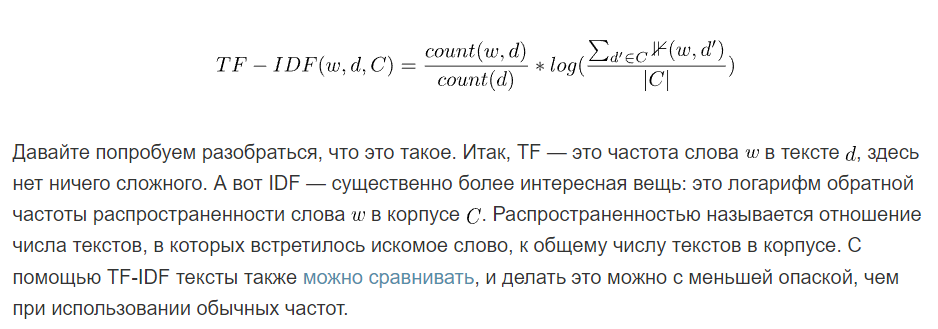

#### Лемматизация текста

In [ ]:
moi_analizator = Mystem()

Installing mystem to /root/.local/bin/mystem from http://download.cdn.yandex.net/mystem/mystem-3.1-linux-64bit.tar.gz


In [ ]:
def preprocess_for_tfidf(text):
  lemmatized_text = moi_analizator.lemmatize(text.lower())
  return ' '.join(lemmatized_text)

#### Описание методики на датасете
- Ключ (дисциплина) — значение (корпус текста)

- TF — частота встречаемости слова в корпусе текста дисциплины
- IDF — обратная частота встречаемости слова в корпусах текстов

- TF = количество раз, которое слово встречается в дисциплине / общее число слов в дисциплине
- IDF = log(число дисциплин/число дисциплин, в которых встречается слово)

In [ ]:
import random
random_discs = [random.choice(list(rpd_nlp_data.keys())) for _ in range(40)]
random_discs

['ведение в специальность 2021',
 'основы проектирования информационных систем пми 2023',
 'корпоративный анализ данных (sql server analysis services) 2023',
 'автоматизированные системы бухгалтерского учета, анализа и аудита в коммерческих организациях 2021',
 'технологии работы с открытыми данными пи 2023',
 'теория вероятностей и математическая статистика би 2022',
 'автоматизированные банковские системы и диджитализация банковских сервисов 2021',
 'основы мобильной разработки пи 2023',
 'теоретические основы финансовых технологий пми 2023',
 'прикладные задачи машинного обучения иб 2023',
 'глубокое обучение пми 2022',
 'методология программирования 2023',
 'технологии работы с открытыми данными пми 2023',
 'методы оптимизации 2022',
 'модели и методы генерации изображений 2022',
 'прикладные задачи машинного обучения и обработки больших данных 2021',
 'инновационные информационные технологии 2023',
 'дискретная математика пинж 2023',
 'рекомендательные системы и коллаборативная фи

In [ ]:
example = [rpd_nlp_data[key] for key in random_discs]
example

['раздел предназначение дисциплины введение в специальность правовые основы высшего образования в российской федерации, структура и задачи дисциплины введение в специальность взаимосвязь данной дисциплины с другими дисциплинами требования предъявляемые к студентам в процессе изучения дисциплины, права обязанности и ответственность студентов согласно федеральному закону об образовании в российской федерации, федеральные государственные образовательные стандарты далее фгос их структура характеристика образовательных программ высшего образования программ бакалавриата программ магистратуры программ подготовки научно педагогических кадров в аспирантуре, право финансового университета на разработку образовательных стандартов особенности образовательных стандартов финансового университета далее ос фу, раздел содержание образовательной программы социальные партнеры научные школы, содержание фгос высшего образования по направлению подготовки прикладная математика и информатика характеристика пр

#### Тестирование

In [ ]:
tf_idf_object = TfidfVectorizer(stop_words=stop_words)
txts_as_tf_idf_vectors = tf_idf_object.fit_transform(preprocess_for_tfidf(text) for text in example)

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:409: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['хотел'] not in stop_words.
  warnings.warn(


In [ ]:
txts_as_tf_idf_vectors

<5x1691 sparse matrix of type '<class 'numpy.float64'>'
	with 2284 stored elements in Compressed Sparse Row format>

In [ ]:
print(txts_as_tf_idf_vectors.shape)

(5, 1691)


In [ ]:
tf_idf_object.get_feature_names_out()[:100]

array(['add', 'amoled', 'anaconda', 'analytical', 'and', 'array', 'as',
       'assert', 'block', 'blockchain', 'blocks', 'brotcher', 'bsp',
       'btc', 'by', 'case', 'catch', 'cmy', 'cmyk', 'code', 'collections',
       'com', 'count', 'counter', 'csv', 'cummulate', 'dae', 'data',
       'dataframe', 'decorator', 'def', 'defaultdict', 'direct', 'divide',
       'ds', 'eeny', 'eight', 'else', 'enum', 'enumerate', 'erp',
       'except', 'explorer', 'filter', 'finally', 'firewall', 'for',
       'from', 'frozen', 'func', 'gif', 'hash', 'height', 'his', 'hsv',
       'html', 'https', 'idef', 'idefo', 'if', 'ii', 'iii', 'import',
       'inf', 'info', 'init', 'ips', 'ipython', 'irr', 'isinstance',
       'item', 'iterable', 'itertools', 'ivanov', 'jpeg', 'json',
       'length', 'line', 'lst', 'lu', 'mad', 'map', 'matplotlib', 'meeny',
       'miney', 'mining', 'modul', 'moe', 'mrp', 'mul', 'multiply', 'my',
       'namedtuple', 'networkx', 'nine', 'notebook', 'npv', 'number',
       'o

In [ ]:
# соответствие между числовыми индексами слов матрицы TF-IDF и самими словами
id2word = {i:word for i, word in enumerate(tf_idf_object.get_feature_names_out())}

# проходимся по матрице и вытащим для каждого текста слова с самым большим tf-idf

for text_row in range(txts_as_tf_idf_vectors.shape[0]):
  # ряд матрицы соответствует тексту
  row_data = txts_as_tf_idf_vectors.getrow(text_row)
  # сортируем в нём все слова (вернее, индексы слов)
  words_this_text = row_data.toarray().argsort()
  # берём крайние 5 слов отсортированного ряда
  top_words_this_text = words_this_text[0, :-6:-1]
  print([id2word[w] for w in top_words_this_text])

['граф', 'динамический', 'размерность', 'графа', 'моделирование']
['система', 'модель', 'линейный', 'экономический', 'функция']
['графический', 'трехмерный', 'координата', 'преобразование', 'двухмерный']
['бухгалтерский', 'учет', 'информационный', 'система', 'счет']
['python', 'список', 'сортировка', 'функция', 'программирование']


#### Функция подсчёта метрики TF-IDF

In [ ]:
def produce_tf_idf_keywords(texts, number_keywords):
  tf_idf_v = TfidfVectorizer(stop_words=stop_words)
  txts_as_tf_idf_vectors = tf_idf_v.fit_transform(preprocess_for_tfidf(text) for text in texts)

  # соответствие между числовыми индексами слов матрицы TF-IDF и самими словами
  id2word = {i:word for i, word in enumerate(tf_idf_v.get_feature_names_out())}

  # проходимся по матрице и вытащим для каждого текста слова с самым большим tf-idf
  top_keywords = []
  for text_row in range(txts_as_tf_idf_vectors.shape[0]):
    # ряд матрицы соответствует тексту
    row_data = txts_as_tf_idf_vectors.getrow(text_row)
    # сортируем в нём все слова (вернее, индексы слов)
    words_this_text = row_data.toarray().argsort()
    # берём крайние {number_keywords} слов отсортированного ряда
    top_words_this_text = words_this_text[0, :-1*(number_keywords+1):-1]
    top_keywords.append([id2word[w] for w in top_words_this_text])

  return top_keywords

In [ ]:
produce_tf_idf_keywords(example, 5)

[['университет',
  'профессиональный',
  'регламент',
  'финуниверситет',
  'математика'],
 ['жизненный', 'информационный', 'проектирование', 'цикл', 'процесс'],
 ['хранилище', 'многомерный', 'корпоративный', 'анализ', 'разрабатывать'],
 ['бухгалтерский', 'учет', 'аудиторский', 'автоматизация', 'счет'],
 ['запрос', 'api', 'веб', 'сайт', 'парсинг'],
 ['случайный', 'вероятность', 'распределение', 'величина', 'дисперсия'],
 ['банковский', 'платежный', 'абс', 'банк', 'платеж'],
 ['мобильный', 'приложение', 'java', 'android', 'разработка'],
 ['платформа', 'блокчейн', 'цифровой', 'финансовый', 'мобильный'],
 ['обучение', 'метод', 'машинный', 'кластерный', 'регрессия'],
 ['сеть', 'pytorch', 'нейронный', 'инс', 'сверточный'],
 ['императивный', 'разрабатывать', 'приложение', 'проектирование', 'понятие'],
 ['запрос', 'api', 'веб', 'сайт', 'парсинг'],
 ['симплекс', 'метод', 'двойственный', 'транспортный', 'постановка'],
 ['изображение', 'случайный', 'автоэнкодер', 'gan', 'поле'],
 ['кредит', 'обу

In [ ]:
produce_tf_idf_keywords(list(rpd_nlp_data.values()), 5)

[['spark', 'hadoop', 'кластер', 'pandas', 'yarn'],
 ['диаграмма', 'гистограмма', 'визуальный', 'линейчатый', 'microsoft'],
 ['sql', 'python', 'язык', 'подзапрос', 'использование'],
 ['сеть', 'нейронный', 'learning', 'нейрон', 'архитектура'],
 ['excel', 'ms', 'сводный', 'диаграмма', 'форматирование'],
 ['вещь', 'интернет', 'arduino', 'плк', 'проект'],
 ['моделирование', 'агентный', 'имитационный', 'случайный', 'anylogic'],
 ['риск', 'имитационный', 'построение', 'нечеткий', 'нечетко'],
 ['сеть', 'нейронный', 'нейрон', 'персептрон', 'keras'],
 ['бухгалтерский', 'учет', 'счет', 'информационный', 'ндс'],
 ['уравнение', 'линейный', 'однородный', 'порядок', 'дифференциальный'],
 ['кластеризация', 'февраль', 'заработный', 'оценка', 'olap'],
 ['бухгалтерский', 'учет', 'аудиторский', 'автоматизация', 'счет'],
 ['python', 'sql', 'язык', 'библиотека', 'подзапрос'],
 ['java', 'интерфейс', 'swing', 'поток', 'наследование'],
 ['список', 'словарь', 'библиотека', 'python', 'акция'],
 ['рейтинг', 'поль

#### Адаптированная функция поиска N-грамм

In [ ]:
from nltk import ngrams

def produce_tf_idf_ngrams(texts, number_keywords, ngram_range=(1, 3)):
    tf_idf_v = TfidfVectorizer(stop_words=stop_words, ngram_range=ngram_range)
    txts_as_tf_idf_vectors = tf_idf_v.fit_transform(preprocess_for_tfidf(text) for text in texts)

    # Соответствие между числовыми индексами слов матрицы TF-IDF и самими словами
    id2word = {i: word for i, word in enumerate(tf_idf_v.get_feature_names_out())}

    # Проходимся по матрице и вытаскиваем для каждого текста n-граммы с самым большим TF-IDF
    top_keywords = []
    for text_row in range(txts_as_tf_idf_vectors.shape[0]):
        # Ряд матрицы соответствует тексту
        row_data = txts_as_tf_idf_vectors.getrow(text_row)
        # Сортируем в нём все слова (вернее, индексы слов)
        words_this_text = row_data.toarray().argsort()
        # Берём крайние {number_keywords} слов отсортированного ряда
        top_words_this_text = words_this_text[0, :-1*(number_keywords + 1):-1]
        top_keywords.append([id2word[w] for w in top_words_this_text])

    return top_keywords

##### Тестирование

In [ ]:
produce_tf_idf_ngrams(example, 5, (2, 2))

[['прикладной математика',
  'финансовый университет',
  'трудовой функция',
  'проведение текущий',
  'учебный план'],
 ['жизненный цикл',
  'цикл информационный',
  'case средство',
  'стандартизация процесс',
  'программный средство'],
 ['многомерный анализ',
  'корпоративный информационный',
  'многомерный шкалирование',
  'анализ корпоративный',
  'использование многомерный'],
 ['бухгалтерский учет',
  'автоматизация бухгалтерский',
  'экономический анализ',
  'аудиторский проверка',
  'план счет'],
 ['веб страница', 'парсинг веб', 'curl запрос', 'rest api', 'разный источник'],
 ['случайный величина',
  'математический ожидание',
  'дискретный случайный',
  'ожидание дисперсия',
  'абсолютно непрерывный'],
 ['банковский сфера',
  'диджитализация банковский',
  'архитектура абс',
  'построение абс',
  'технология банковский'],
 ['мобильный приложение',
  'компонент мобильный',
  'добавлять стиль',
  'стиль помощь',
  'разработка приложение'],
 ['цифровой платформа',
  'финансовый т

In [ ]:
produce_tf_idf_ngrams(example, 5, (3, 3))

[['проведение текущий контроль',
  'область анализ машинный',
  'контроль успеваемость промежуточный',
  'успеваемость промежуточный аттестация',
  'трудовой функция трудовой'],
 ['жизненный цикл информационный',
  'стандартизация процесс жизненный',
  'процесс жизненный цикл',
  'программный средство процесс',
  'рекомендация построение диаграмма'],
 ['многомерный анализ корпоративный',
  'анализ корпоративный информационный',
  'использование многомерный анализ',
  'технология оперативный аналитический',
  'оперативный аналитический обработка'],
 ['автоматизация бухгалтерский учет',
  'компьютерный бухгалтерский учет',
  'форма бухгалтерский учет',
  'информационный бухгалтерский учет',
  'анализ информационный база'],
 ['парсинг веб страница',
  'выбирать подходящий зависимость',
  'объединять разный источник',
  'запрос командный строка',
  'csv xml json'],
 ['дискретный случайный величина',
  'математический ожидание дисперсия',
  'абсолютно непрерывный случайный',
  'распределени

In [ ]:
produce_tf_idf_ngrams(example, 5, (4, 4))

[['загружать библиотека sklearn датасет',
  'классификация загружать библиотека sklearn',
  'эффективность классификация загружать библиотека',
  'построить модель классификация объект',
  'библиотека sklearn датасет ирис'],
 ['написать программа микроконтроллер arduino',
  'программа микроконтроллер arduino реализовать',
  'эмулятор proteus написать программа',
  'proteus написать программа микроконтроллер',
  'программа step wincc реализовать'],
 ['принцип построение кластерный система',
  'структура принцип построение кластерный',
  'журнал событие web сервер',
  'latin структура инструкция выражение',
  'обработка данные экосистема hadoop'],
 ['данные машинный обучение принятие',
  'сервис основывать обработка данные',
  'бизнес финансовый отрасль разделение',
  'форма бизнес финансовый отрасль',
  'трансформация финансовый отрасль цифровой'],
 ['предварительный анализ данные построение',
  'анализ данные построение признак',
  'загружать библиотека sklearn датасет',
  'классификац

### Word2Vec модель

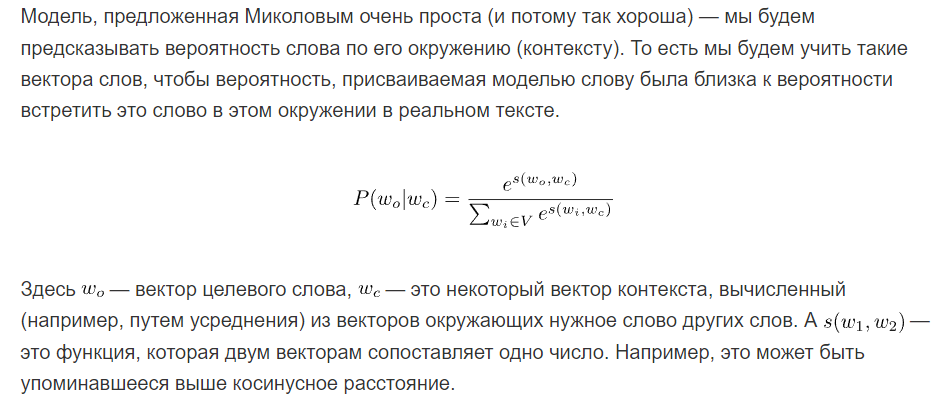

#### Готовая модель & TF-IDF

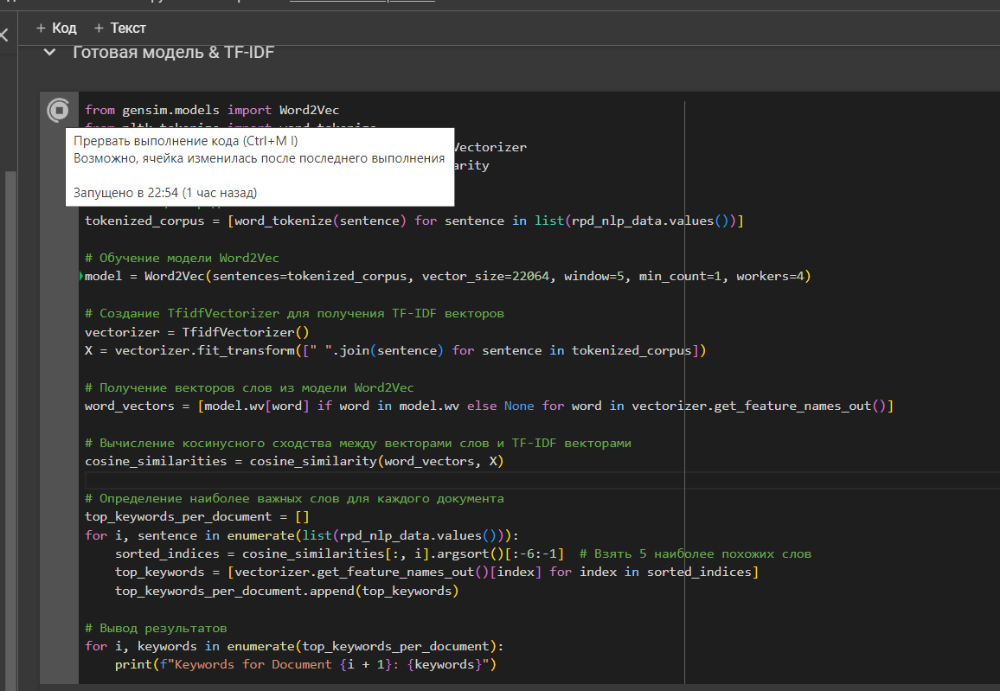

In [ ]:
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Токенизация предложений
tokenized_corpus = [word_tokenize(sentence) for sentence in list(rpd_nlp_data.values())]

# Обучение модели Word2Vec
model = Word2Vec(sentences=tokenized_corpus, vector_size=22064, window=5, min_count=1, workers=4)

# Создание TfidfVectorizer для получения TF-IDF векторов
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform([" ".join(sentence) for sentence in tokenized_corpus])

# Получение векторов слов из модели Word2Vec
word_vectors = [model.wv[word] if word in model.wv else None for word in vectorizer.get_feature_names_out()]

# Вычисление косинусного сходства между векторами слов и TF-IDF векторами
cosine_similarities = cosine_similarity(word_vectors, X)

# Определение наиболее важных слов для каждого документа
top_keywords_per_document = []
for i, sentence in enumerate(list(rpd_nlp_data.values())):
    sorted_indices = cosine_similarities[:, i].argsort()[:-6:-1]  # Взять 5 наиболее похожих слов
    top_keywords = [vectorizer.get_feature_names_out()[index] for index in sorted_indices]
    top_keywords_per_document.append(top_keywords)

# Вывод результатов
for i, keywords in enumerate(top_keywords_per_document):
    print(f"Keywords for Document {i + 1}: {keywords}")

#### Создание собственной нейронной сети

In [ ]:
from collections import Counter
import random
import numpy as np
import torch
from torch import nn
import torch.optim as optim

In [ ]:
example = [rpd_nlp_data['mlops 2022'], rpd_nlp_data['web программирование пи 2023'], rpd_nlp_data['алгебра и анализ пи 2023'], rpd_nlp_data['базы данных 2023'], rpd_nlp_data['большие данные и машинное обучение 2023']]
example

['тема введение в mlops, что такое mlops и зачем он нужен определение интеллектуальных информационных систем особенности иис жизненный цикл программного обеспечения неприменимость классических моделей жизненного цикла к иис, методология mlops принципы devops и data science в mlops контроль версий и автоматизированные сборочные процессы, тема инфраструктура для автоматизации процесса разработки обучения и развертывания моделей машинного обучения, как создать инфраструктуру для mlops настройка среды разработки и обучения моделей настройка инструментов для автоматического развертывания моделей встраивание моделей машинного обучения в информационные продукты инфраструктура иис зависимость от внешней среды, взаимосвязь разработки в ноутбуках и продуктовом окружении, тема непрерывная интеграция и доставка в mlops, классический конвейер ci cd особенности иис основные риски этапизация проекта по разработке и внедрению иис инструментальные средства непрерывной доставки и интеграции иис, особенн

In [ ]:
def preprocess(text):

    # Replace punctuation with tokens so we can use them in our model
    text = text.lower()
    text = text.replace('.', ' <PERIOD> ')
    text = text.replace(',', ' <COMMA> ')
    text = text.replace('"', ' <QUOTATION_MARK> ')
    text = text.replace(';', ' <SEMICOLON> ')
    text = text.replace('!', ' <EXCLAMATION_MARK> ')
    text = text.replace('?', ' <QUESTION_MARK> ')
    text = text.replace('(', ' <LEFT_PAREN> ')
    text = text.replace(')', ' <RIGHT_PAREN> ')
    text = text.replace('--', ' <HYPHENS> ')
    text = text.replace('?', ' <QUESTION_MARK> ')
    text = text.replace('\n', ' <NEW_LINE> ')
    text = text.replace(':', ' <COLON> ')
    words = text.split()

    # Remove all words with 4 or fewer occurences
    word_counts = Counter(words)
    trimmed_words = [i for i in words if word_counts[i] > 4]

    return trimmed_words

In [ ]:
# get list of words
words = preprocess(example[0])
print(words[:30])

['тема', 'в', 'mlops', '<COMMA>', 'что', 'такое', 'mlops', 'и', 'иис', 'моделей', 'к', 'иис', '<COMMA>', 'mlops', 'и', 'в', 'mlops', 'и', '<COMMA>', 'тема', 'для', 'разработки', 'обучения', 'и', 'развертывания', 'моделей', 'машинного', 'обучения', '<COMMA>', 'как']


In [ ]:
# print some stats about this word data
print("Total words in text: {}".format(len(words)))
print("Unique words: {}".format(len(set(words)))) # `set` removes any duplicate words

Total words in text: 1080
Unique words: 49


In [ ]:
def create_lookup_tables(words):
    """
    Create lookup tables for vocabulary
    :param words: Input list of words
    :return: Two dictionaries, vocab_to_int, int_to_vocab
    """
    word_counts = Counter(words)
    # sorting the words from most to least frequent in text occurrence
    sorted_vocab = sorted(word_counts, key=word_counts.get, reverse=True)
    # create int_to_vocab dictionaries
    int_to_vocab = {i:j for i, j in enumerate(sorted_vocab)}
    vocab_to_int = {j:i for i, j in int_to_vocab.items()}

    return vocab_to_int, int_to_vocab

In [ ]:
vocab_to_int, int_to_vocab = create_lookup_tables(words)
int_words = [vocab_to_int[word] for word in words]

print(int_words[:30])

[30, 8, 3, 0, 14, 15, 3, 1, 23, 9, 43, 23, 0, 3, 1, 8, 3, 1, 0, 30, 12, 20, 4, 1, 31, 9, 5, 4, 0, 2]


In [ ]:
threshold = 1e-5
word_counts = Counter(int_words)
print(list(word_counts.items())[0:4])  # dictionary of int_words, how many times they appear

total_count = len(int_words)
freqs = {w:count/total_count for w, count in word_counts.items()}
p_drop = {word: (1 - np.sqrt(total_count/freqs[word])) for word in word_counts}
# discard some frequent words, according to the subsampling equation
# create a new list of words for training
train_words = [word for word in int_words if random.random() < (1 - p_drop[word])]

print(train_words[:30])

[(30, 6), (8, 41), (3, 64), (0, 117)]
[30, 8, 3, 0, 14, 15, 3, 1, 23, 9, 43, 23, 0, 3, 1, 8, 3, 1, 0, 30, 12, 20, 4, 1, 31, 9, 5, 4, 0, 2]


In [ ]:
def get_target(words, idx, window_size=5):
    ''' Get a list of words in a window around an index. '''

    R = np.random.randint(1, window_size+1)
    start = idx-R if (idx-R) > 0 else 0
    stop = idx+R
    target_words = words[start:idx] + words[idx+1:stop+1]

    return list(target_words)

In [ ]:
def get_batches(words, batch_size, window_size=5):
    ''' Create a generator of word batches as a tuple (inputs, targets) '''

    n_batches = len(words)//batch_size

    # only full batches
    words = words[:n_batches*batch_size]

    for idx in range(0, len(words), batch_size):
        x, y = [], []
        batch = words[idx:idx+batch_size]
        for ii in range(len(batch)):
            batch_x = batch[ii]
            batch_y = get_target(batch, ii, window_size)
            y.extend(batch_y)
            x.extend([batch_x]*len(batch_y))
        yield x, y

In [ ]:
int_text = [i for i in range(20)]
x, y = next(get_batches(int_text, batch_size=4, window_size=5))

print('x\n', x)
print('y\n', y)

x
 [0, 0, 0, 1, 1, 1, 2, 2, 2, 3]
y
 [1, 2, 3, 0, 2, 3, 0, 1, 3, 2]


In [ ]:
def cosine_similarity(embedding, valid_size=16, valid_window=100, device='cpu'):
    """ Returns the cosine similarity of validation words with words in the embedding matrix.
        Here, embedding should be a PyTorch embedding module.
    """

    # Here we're calculating the cosine similarity between some random words and
    # our embedding vectors. With the similarities, we can look at what words are
    # close to our random words.

    # cos = (a * b) / |a||b|

    embed_vectors = embedding.weight

    # magnitude of embedding vectors, |b|
    magnitudes = embed_vectors.pow(2).sum(dim=1).sqrt().unsqueeze(0)

    # pick N words from our ranges (0,window) and (1000,1000+window). lower id implies more frequent
    valid_examples = np.array(random.sample(range(valid_window), valid_size//2))
    valid_examples = np.append(valid_examples, random.sample(range(1000,1000+valid_window), valid_size//2))
    valid_examples = torch.LongTensor(valid_examples).to(device)

    valid_vectors = embedding(valid_examples)
    similarities = torch.mm(valid_vectors, embed_vectors.t())/magnitudes

    return valid_examples, similarities

In [ ]:
class SkipGramNeg(nn.Module):
    def __init__(self, n_vocab, n_embed, noise_dist=None):
        super().__init__()

        self.n_vocab = n_vocab
        self.n_embed = n_embed
        self.noise_dist = noise_dist

        # define embedding layers for input and output words
        self.in_embed = nn.Embedding(n_vocab, n_embed)
        self.out_embed = nn.Embedding(n_vocab, n_embed)

        # Initialize embedding tables with uniform distribution
        # I believe this helps with convergence
        self.in_embed.weight.data.uniform_(-1, 1)
        self.out_embed.weight.data.uniform_(-1, 1)

    def forward_input(self, input_words):
        input_vectors = self.in_embed(input_words)
        return input_vectors

    def forward_output(self, output_words):
        output_vectors = self.out_embed(output_words)
        return output_vectors

    def forward_noise(self, batch_size, n_samples):
        """ Generate noise vectors with shape (batch_size, n_samples, n_embed)"""
        if self.noise_dist is None:
            # Sample words uniformly
            noise_dist = torch.ones(self.n_vocab)
        else:
            noise_dist = self.noise_dist

        # Sample words from our noise distribution
        noise_words = torch.multinomial(noise_dist,
                                        batch_size * n_samples,
                                        replacement=True)

        device = "cuda" if model.out_embed.weight.is_cuda else "cpu"
        noise_words = noise_words.to(device)

        noise_vectors = self.out_embed(noise_words).view(batch_size, n_samples, self.n_embed)

        return noise_vectors

In [ ]:
class NegativeSamplingLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, input_vectors, output_vectors, noise_vectors):

        batch_size, embed_size = input_vectors.shape

        # Input vectors should be a batch of column vectors
        input_vectors = input_vectors.view(batch_size, embed_size, 1)

        # Output vectors should be a batch of row vectors
        output_vectors = output_vectors.view(batch_size, 1, embed_size)

        # bmm = batch matrix multiplication
        # correct log-sigmoid loss
        out_loss = torch.bmm(output_vectors, input_vectors).sigmoid().log()
        out_loss = out_loss.squeeze().sum(-1)  # sum the losses over the sample of output vectors

        # incorrect log-sigmoid loss
        noise_loss = torch.bmm(noise_vectors.neg(), input_vectors).sigmoid().log()
        noise_loss = noise_loss.squeeze().sum(1)  # sum the losses over the sample of noise vectors

        # negate and sum correct and noisy log-sigmoid losses
        # return average batch loss
        return -(out_loss + noise_loss).mean()

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Get our noise distribution
# Using word frequencies calculated earlier in the notebook
word_freqs = np.array(sorted(freqs.values(), reverse=True))
unigram_dist = word_freqs/word_freqs.sum()
noise_dist = torch.from_numpy(unigram_dist**(0.75)/np.sum(unigram_dist**(0.75)))

# instantiating the model
embedding_dim = 300
model = SkipGramNeg(len(vocab_to_int), embedding_dim, noise_dist=noise_dist).to(device)

# using the loss that we defined
criterion = NegativeSamplingLoss()
optimizer = optim.Adam(model.parameters(), lr=0.003)

print_every = 1500
steps = 0
epochs = 5

# train for some number of epochs
for e in range(epochs):

    # get our input, target batches
    for input_words, target_words in get_batches(train_words, 270):
        steps += 1
        inputs, targets = torch.LongTensor(input_words), torch.LongTensor(target_words)
        inputs, targets = inputs.to(device), targets.to(device)

        # input, output, and noise vectors
        input_vectors = model.forward_input(inputs)
        output_vectors = model.forward_output(targets)
        noise_vectors = model.forward_noise(inputs.shape[0], 5)

        # negative sampling loss
        loss = criterion(input_vectors, output_vectors, noise_vectors)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # loss stats
        if steps % print_every == 0:
            print("Epoch: {}/{}".format(e+1, epochs))
            print("Loss: ", loss.item()) # avg batch loss at this point in training
            valid_examples, valid_similarities = cosine_similarity(model.in_embed, device=device)
            _, closest_idxs = valid_similarities.topk(6)

            valid_examples, closest_idxs = valid_examples.to('cpu'), closest_idxs.to('cpu')
            for ii, valid_idx in enumerate(valid_examples):
                closest_words = [int_to_vocab[idx.item()] for idx in closest_idxs[ii]][1:]
                print(int_to_vocab[valid_idx.item()] + " | " + ', '.join(closest_words))
            print("...\n")

## Выгрузка результатов

Структура выгружаемых результатов работы NLP модели:
- Название дисциплины
  - ключевые слова
  - биграммы
  - триграммы
  - название файла с рпд



In [ ]:
name_to_file_rpd

{'прикладные задачи машинного обучения и обработки больших данных 2020': 'Прикл задачи МОиОБД, Эк, КФУ.docx',
 'методы визуализации данных 2020': 'Методы ВД,Эк,КФУ.docx',
 'программирование на языках python и sql 2020': 'Програм. на языках PYTHON и SQL,Эк, КФУ.docx',
 'нейронные сети 2020': 'Нейронные сети,Эк, КФУ.docx',
 'обработка данных и моделирование в microsoft excel 2020': 'Обработка данных и мод. в МЕ,Эк, КФУ.docx',
 'интернет вещей 2021': 'Инт вещей, ПИ, 2021.docx',
 'агентное моделирование 2021': 'Агент мод.docx',
 'интеллектуальные технологии в управлении рисками 2021': 'Интел тех в УР.docx',
 'современные нейросетевые технологии 2021': 'Соврем НТ, 2021.docx',
 'бухгалтерские информационные системы 2021': 'Бухгалтерские ИС.docx',
 'дифференциальные уравнения 2021': 'Диф урав.docx',
 'методология поиска источников данных и подготовки данных для анализа 2021': 'Метод ПИДиПДДА.docx',
 'автоматизированные системы бухгалтерского учета, анализа и аудита в коммерческих организаци

In [ ]:
main_keywords = produce_tf_idf_keywords(list(rpd_nlp_data.values()), 5)
main_bigramms = produce_tf_idf_ngrams(list(rpd_nlp_data.values()), 5, (2, 2))
main_threegramms = produce_tf_idf_ngrams(list(rpd_nlp_data.values()), 5, (3, 3))

key_wordsgramms_rpd = {}
for key, word, twogramm, threegramm, filename in zip(rpd_nlp_data.keys(), main_keywords, main_bigramms, main_threegramms, name_to_file_rpd.values()):
  key_wordsgramms_rpd[key] = {}
  key_wordsgramms_rpd[key]['keywords'] = word
  key_wordsgramms_rpd[key]['twogramms'] = twogramm
  key_wordsgramms_rpd[key]['threegramms'] = threegramm
  key_wordsgramms_rpd[key]['filename'] = filename

key_wordsgramms_rpd

{'прикладные задачи машинного обучения и обработки больших данных 2020': {'keywords': ['spark',
   'hadoop',
   'кластер',
   'pandas',
   'yarn'],
  'twogramms': ['структура кластер',
   'hadoop принцип',
   'кластер yarn',
   'машинный обучение',
   'spark реализация'],
  'threegramms': ['библиотека pandas объект',
   'решение машинный обучение',
   'scikit learn решение',
   'learn решение машинный',
   'интерпретация результат выявлять'],
  'filename': 'Прикл задачи МОиОБД, Эк, КФУ.docx'},
 'методы визуализации данных 2020': {'keywords': ['диаграмма',
   'гистограмма',
   'визуальный',
   'линейчатый',
   'microsoft'],
  'twogramms': ['линейчатый диаграмма',
   'визуальный элемент',
   'microsoft power',
   'power bi',
   'microsoft excel'],
  'threegramms': ['microsoft power bi',
   'накопление линейный гистограмма',
   'линейный гистограмма гистограмма',
   'база банка фильтрация',
   'фильтрация формирование отчет'],
  'filename': 'Методы ВД,Эк,КФУ.docx'},
 'программирование на 

In [ ]:
try:
  with open("/content/gdrive/MyDrive/Диплом_Валяев/data/rpd_keywords_ngramms.json", "w", encoding="utf-8") as file:
      json.dump(key_wordsgramms_rpd, file)
  print('Загрузка датасета прошла успешно!\nСоздан файл «rpd_keywords_ngramms.json».')
except Exception as e:
  print('Ошибка:\n', traceback.format_exc())

Загрузка датасета прошла успешно!
Создан файл «rpd_keywords_ngramms.json».
